<a href="https://colab.research.google.com/github/RizqiRHuda/PVCK_Semester5/blob/main/tugasbesar_pcvk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import imutils
import cv2
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
network = load_model('/content/drive/MyDrive/img_python/content/network2')
network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

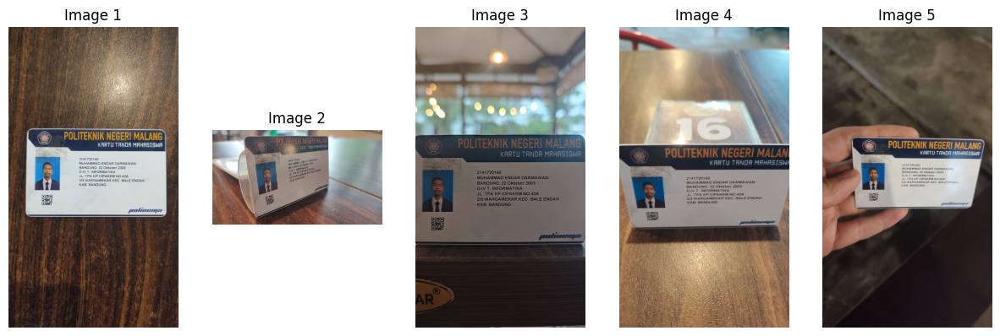

In [4]:
import cv2
from matplotlib import pyplot as plt
import os
import fnmatch

directory = '/content/drive/MyDrive/img_python/content/Kelompok 1/Kelompok 1/'

# Filter file with extension .jpg and name containing '2141720160'
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg")) and fnmatch.fnmatchcase(file, '*2141720160*')]

# Set the figure size
plt.figure(figsize=(15, 10))

# Loop through the filtered images
for i, file in enumerate(image_files, 1):
    img_path = os.path.join(directory, file)

    # Read the image
    img = cv2.imread(img_path)

    # Convert BGR to RGB for matplotlib display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot each image
    plt.subplot(1, len(image_files), i)
    plt.imshow(img_rgb)
    plt.title(f'Image {i}')
    plt.axis('off')

# Show the plot
plt.show()


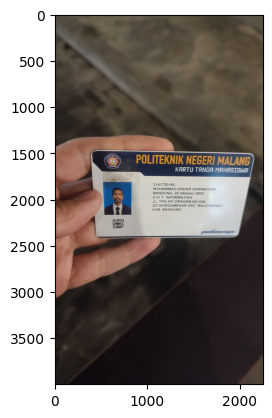

In [ ]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
img.shape

(4000, 2252, 3)

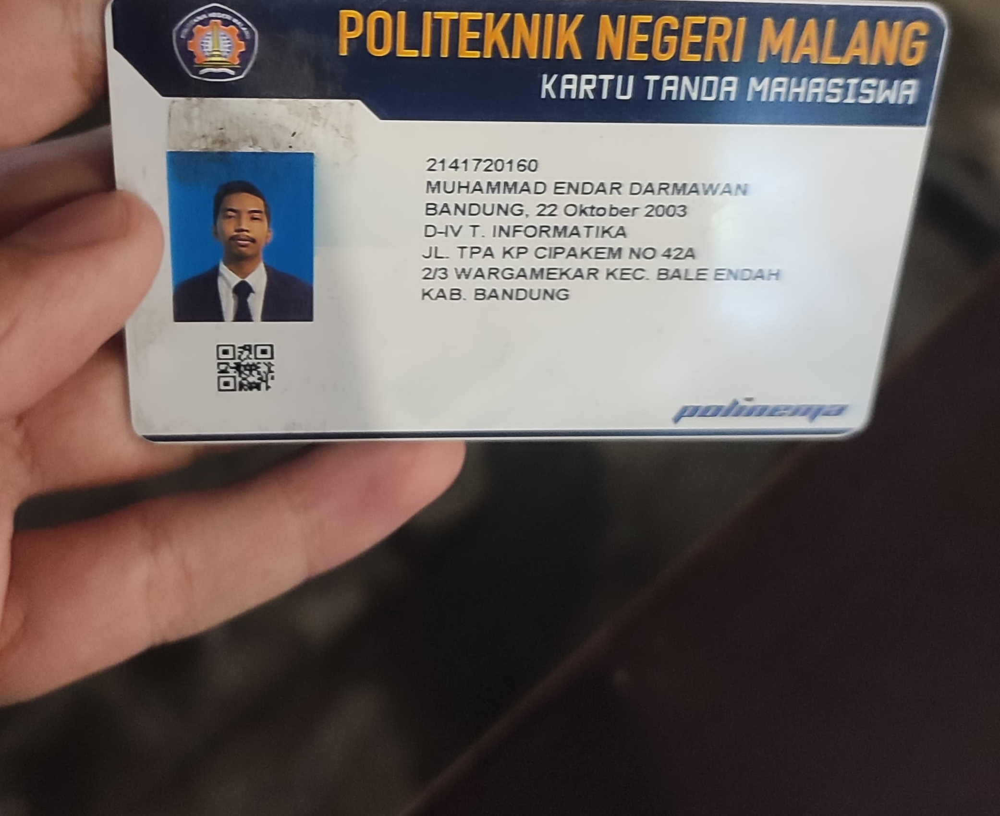

In [ ]:
crop = img[1500:3200, 170:2880]
cv2_imshow(crop)

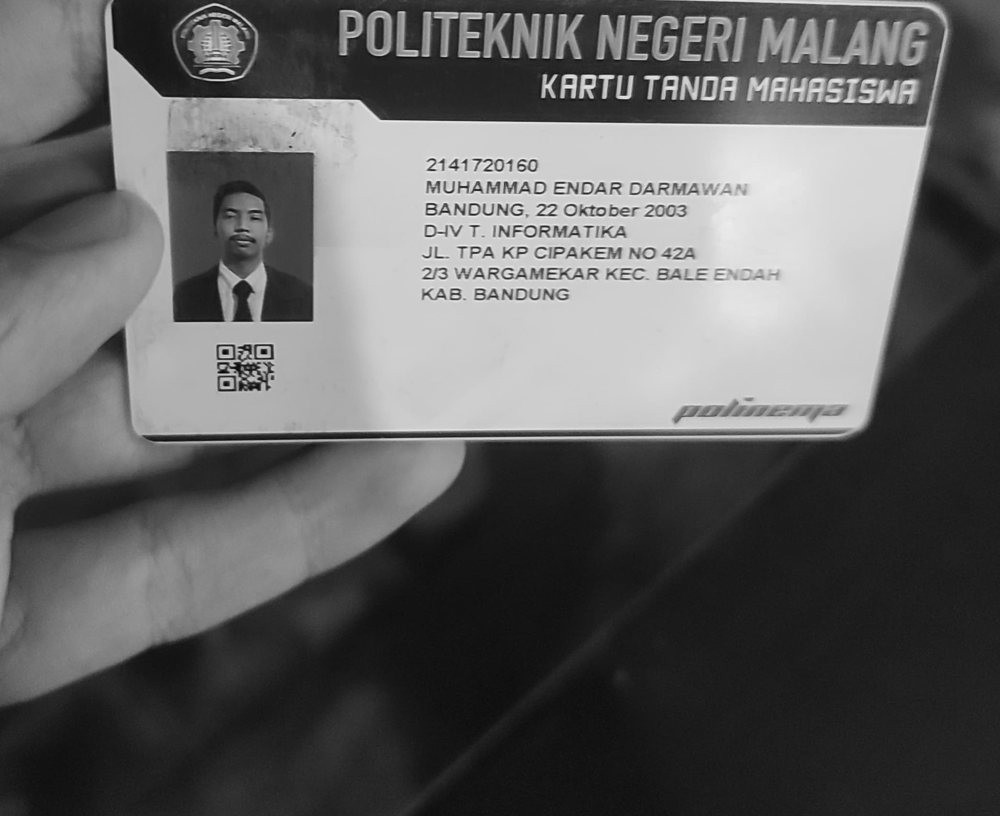

In [ ]:
gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
# show
cv2_imshow(gray)

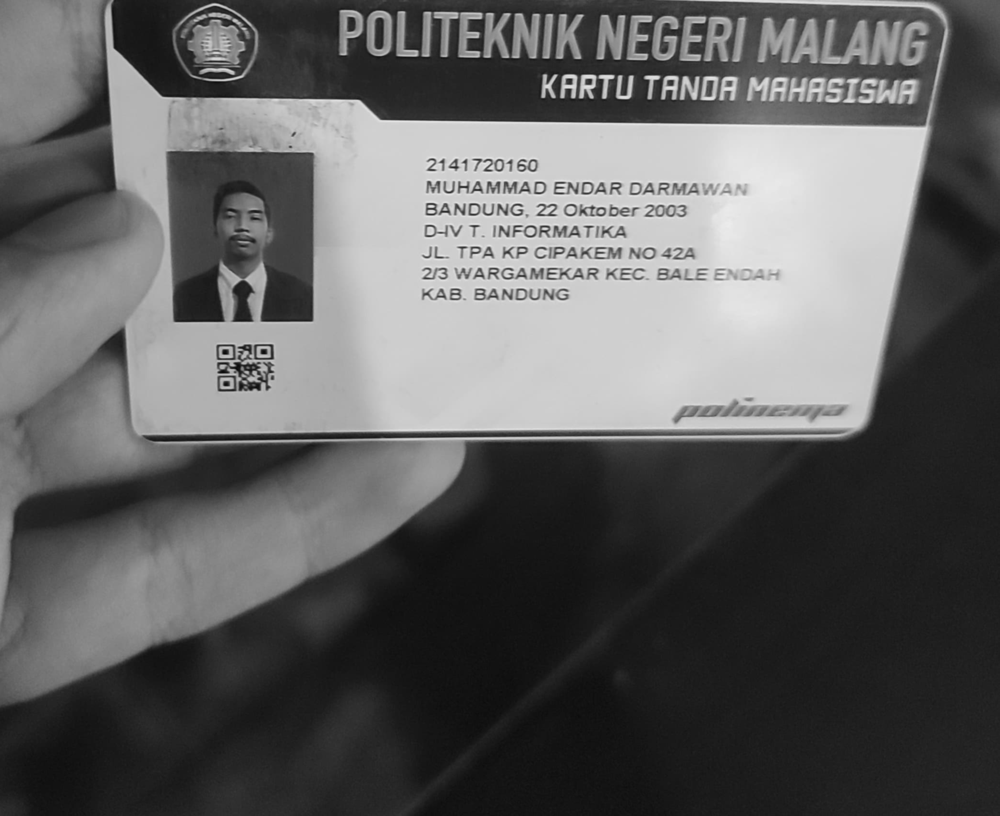

In [ ]:
blur = cv2.GaussianBlur(gray, (3,3), 0)
# check
cv2_imshow(blur)

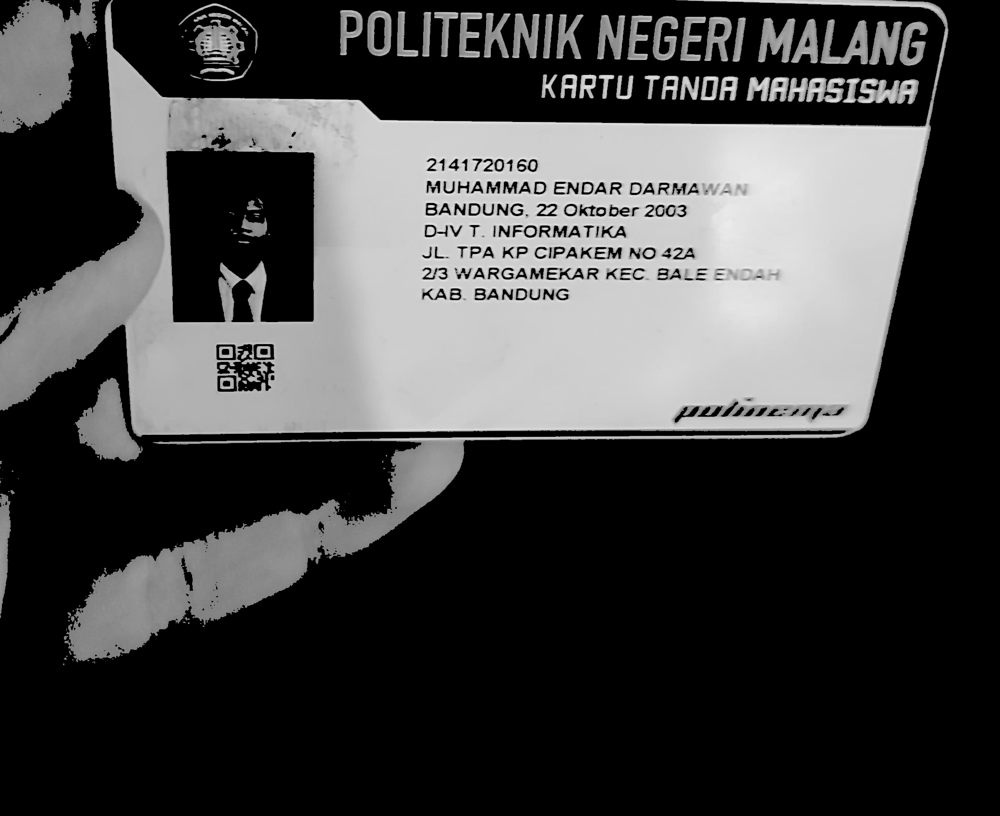

In [ ]:
ret, zero_threshold = cv2.threshold(blur, 127, 255, cv2.THRESH_TOZERO)
# check
cv2_imshow(zero_threshold)

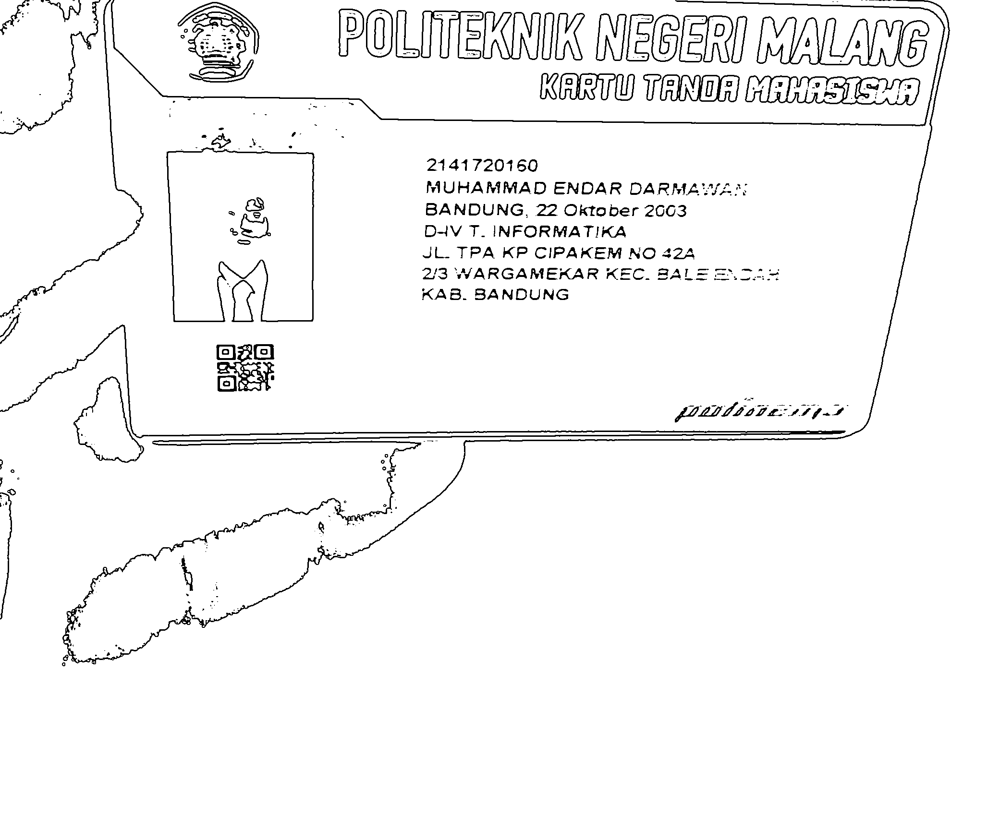

In [ ]:
adaptive = cv2.adaptiveThreshold(zero_threshold, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
# check
cv2_imshow(adaptive)

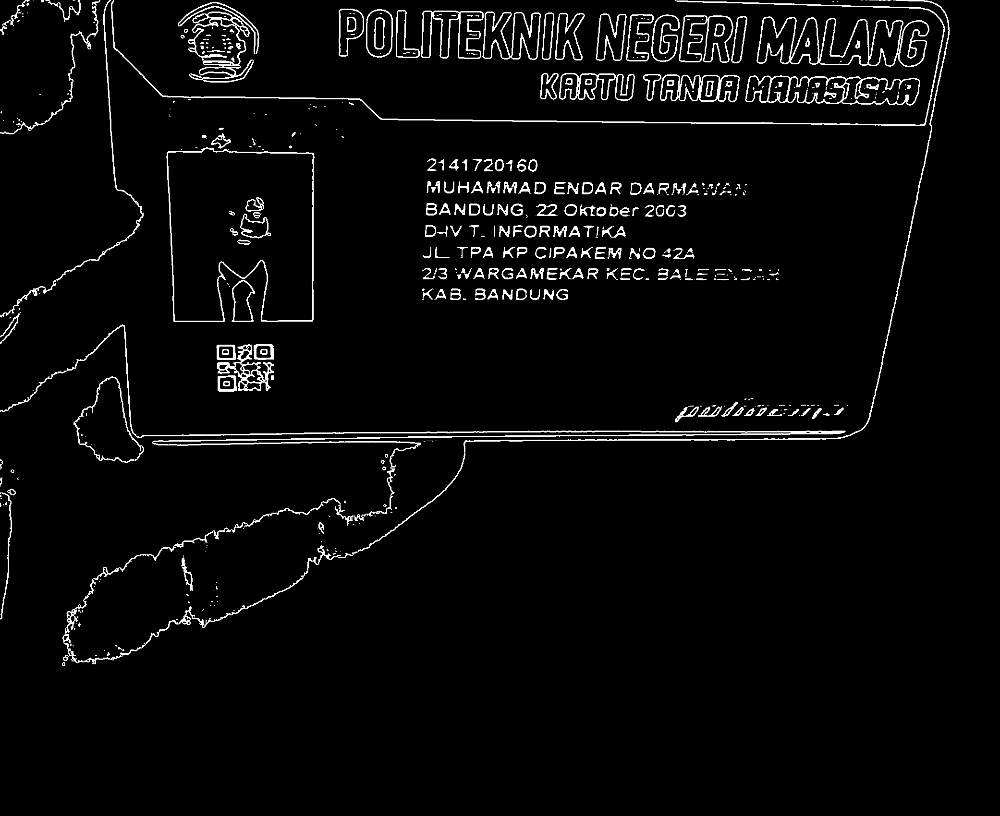

In [ ]:
# inverse image since we trained out model
# with black background
invertion = 255 - adaptive
# check
cv2_imshow(invertion)

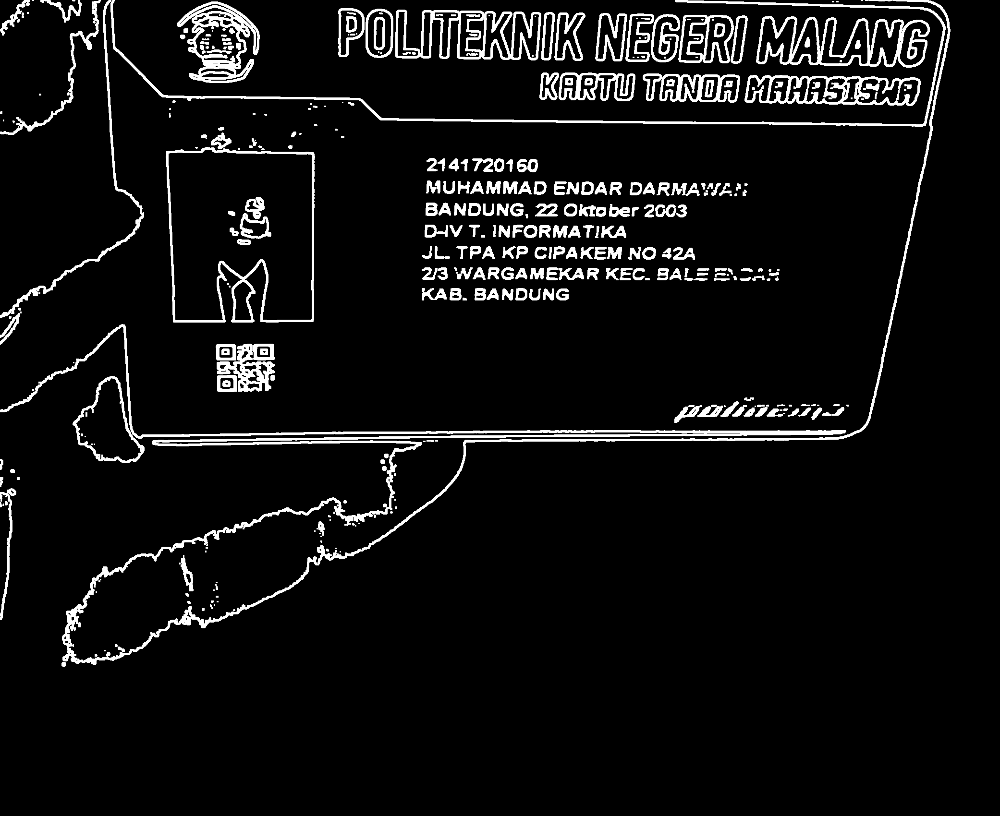

In [ ]:
dilation = cv2.dilate(invertion, np.ones((3,3)))
# check
cv2_imshow(dilation)

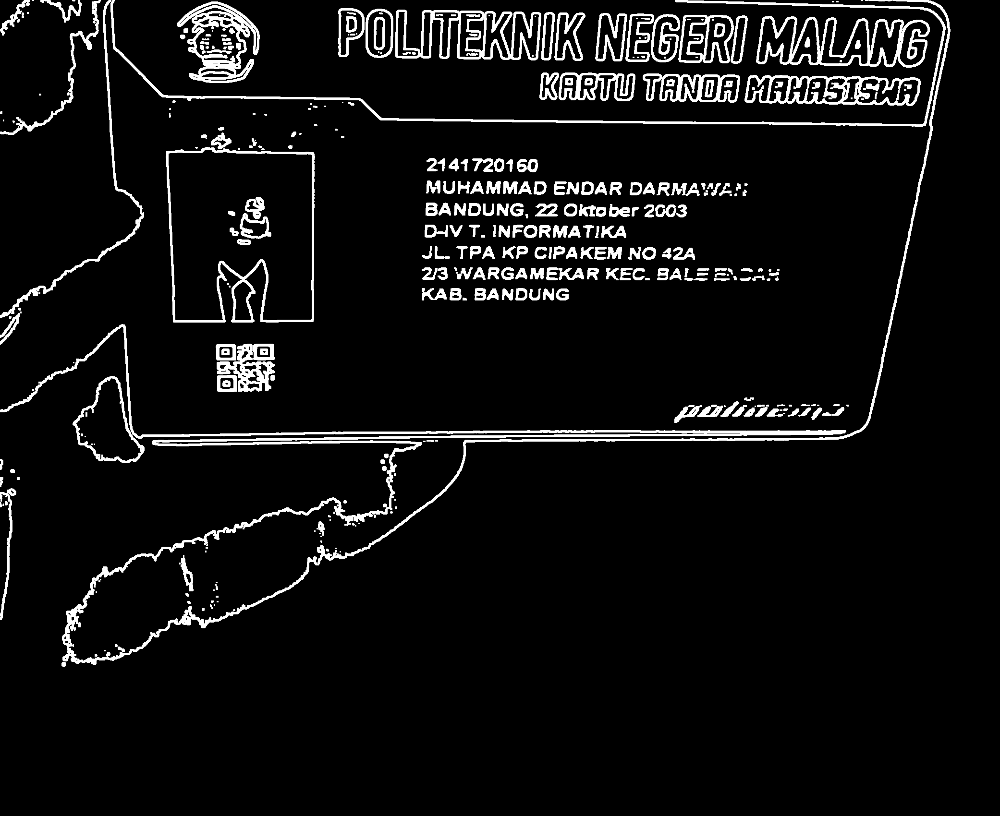

In [ ]:
# Test erode
erode = cv2.erode(dilation, np.ones((1,1)))
cv2_imshow(erode)

In [ ]:
# Define function for contour detection
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method='left-to-right')[0]

  return conts

In [ ]:
conts = find_contours(erode.copy())

In [ ]:
# Check contour value
conts

(array([[[   0, 1046]],
 
        [[   0, 1056]],
 
        [[   2, 1056]],
 
        [[   3, 1055]],
 
        [[   3, 1051]],
 
        [[   2, 1050]],
 
        [[   2, 1047]],
 
        [[   1, 1046]]], dtype=int32),
 array([[[  22, 1017]],
 
        [[  21, 1018]],
 
        [[  20, 1018]],
 
        [[  19, 1019]],
 
        [[  18, 1019]],
 
        [[  17, 1020]],
 
        [[  15, 1020]],
 
        [[  15, 1021]],
 
        [[  14, 1022]],
 
        [[  14, 1025]],
 
        [[  15, 1026]],
 
        [[  15, 1027]],
 
        [[  14, 1028]],
 
        [[  13, 1027]],
 
        [[  11, 1027]],
 
        [[  10, 1026]],
 
        [[   8, 1026]],
 
        [[   7, 1025]],
 
        [[   0, 1025]],
 
        [[   0, 1039]],
 
        [[   1, 1040]],
 
        [[   3, 1040]],
 
        [[   4, 1039]],
 
        [[   4, 1037]],
 
        [[   3, 1036]],
 
        [[   3, 1035]],
 
        [[   4, 1034]],
 
        [[   4, 1032]],
 
        [[   2, 1030]],
 
        [[   3, 1029]],
 

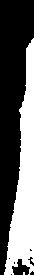

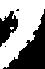

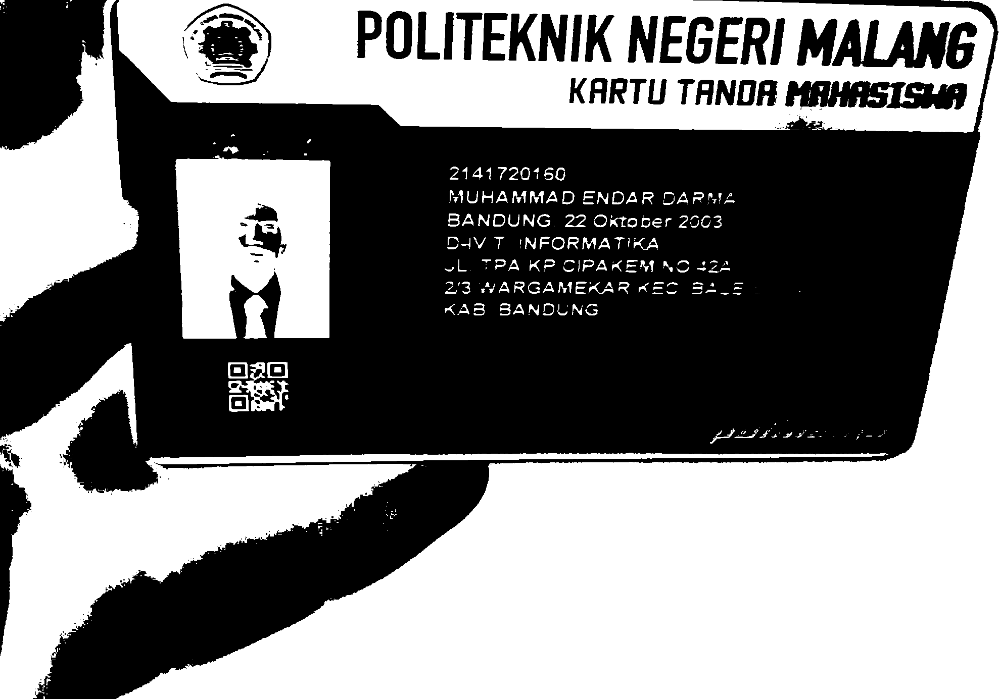

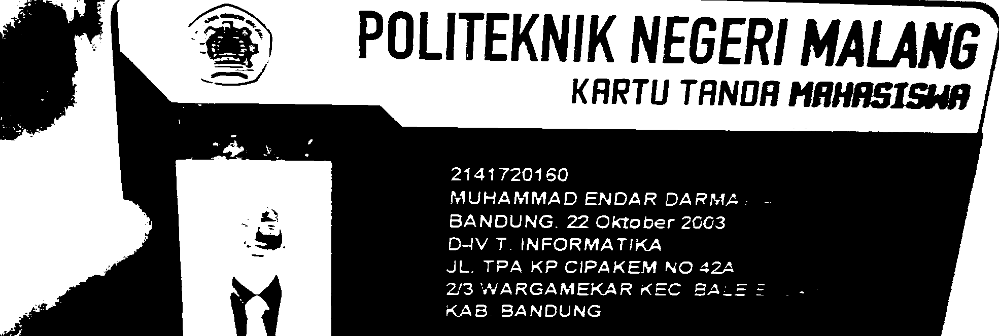

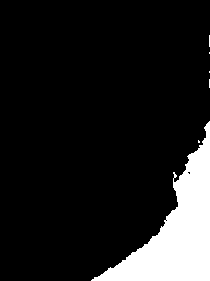

...

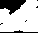

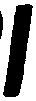

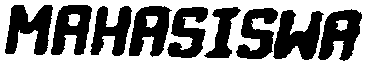

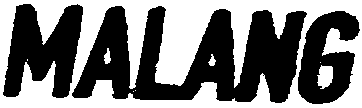

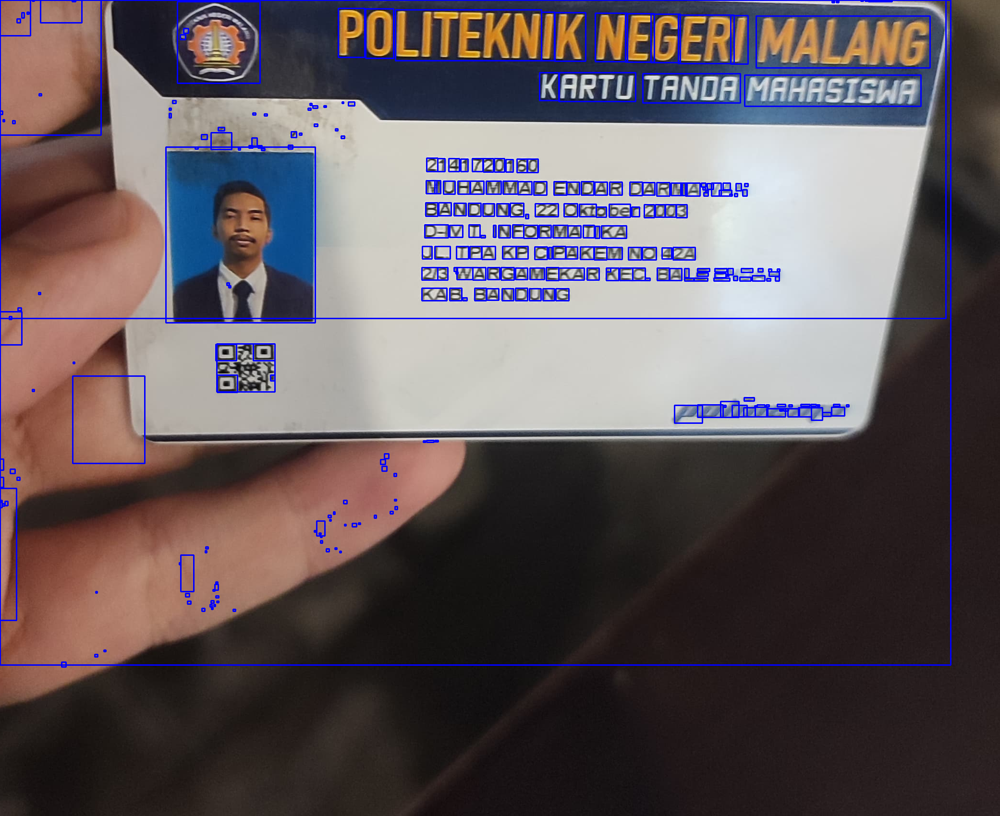

In [ ]:
# Get the char based on contour

# Setup min/max width/hight for char
min_w, max_w = 10, 160
min_h, max_h = 14, 140
img_copy = crop.copy() # original image for plotting countour result

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
  # if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
  roi = gray[y:y+h, x:x+w] # get region of interest for char
  thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  cv2_imshow(thresh) # check

  # Build bounding box on original image
  cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

# Show bounding box on original image
cv2_imshow(img_copy)

In [ ]:
def extract_roi(img):
  roi = img[y:y+h, x:x+w]

  return roi

In [ ]:
def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  return thresh

In [ ]:
def resize_img(img, w, h):
  if w > h:
    resized = imutils.resize(img, width=28)
  else:
    resized = imutils.resize(img, height=28)

  # (w, h) = resized.shape
  (h, w) = resized.shape

  # Calculate how many pixels need to fill char image
  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))
  filled = cv2.resize(filled, (28,28))

  return filled

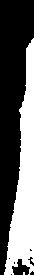

In [ ]:
# Demo for enlarge
(x, y, w, h) = cv2.boundingRect(conts[1])
test_image = thresholding(gray[y:y+h, x:x+w])

# show original test image
cv2_imshow(test_image)

# Show enlarge test image
cv2_imshow(cv2.resize(test_image, (28,28)))

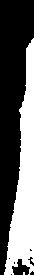

In [ ]:
# Demo by filled strategy
# (w, h) = test_image.shape
(h, w) = test_image.shape

test_image2 = resize_img(test_image, w, h)

cv2_imshow(test_image)
cv2_imshow(test_image2)

In [ ]:
def normalization(img):
  img = img.astype('float32') / 255.0 # convert to floating point
  img = np.expand_dims(img, axis=-1) # add depth
  return img

In [ ]:
# Check
test_image2.shape, normalization(test_image2).shape

((28, 28), (28, 28, 1))

In [ ]:
def process_box(gray, x, y, w, h):

  roi = extract_roi(gray)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)

  # show result
  cv2_imshow(resized)

  normalized = normalization(resized)

  return (normalized, (x, y, w, h))

In [ ]:
# Detect every single char from contour
detected_char = []

for c in conts:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 10, 160
  min_h, max_h = 14, 140

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char.append(process_box(gray, x, y, w, h))

In [ ]:
# check pixel for detected char sample
detected_char[0][0]

array([[[0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        [1.        ],
        

In [ ]:
# check bounding box for detected char sample
detected_char[0][1]

(0, 649, 45, 69)

In [ ]:
# Get all char pixel
pixels = np.array([px[0] for px in detected_char], dtype='float32')

# Get all box for detected char
boxes = [box[1] for box in detected_char]

In [ ]:
pixels.shape

(136, 28, 28, 1)

In [ ]:
digits = '0123456789'
letters = 'ABCDEFGHIJKLMNOPQRSTUVWZYZ'
char_list = digits + letters
char_list = [ch for ch in char_list]

print(char_list)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'Z', 'Y', 'Z']


In [ ]:
# Predict
preds = network.predict(pixels)

# check shape -> JTI POLINEMA --> shoud be 11 (from 0 to 10)
preds.shape

5/5 [==============================] - 2s 54ms/step


(136, 36)

In [ ]:
# Char Prediction
for p in preds:
  char_idx = np.argmax(p)
  print(char_list[char_idx], end = " ")

Z E T 1 4 E R G H E 8 G N W 2 J 2 B M 2 L A 3 1 A U 4 B V N T N H 3 D T P A T A B A U 2 M A R O N N G N K M 1 G F D A P G A O 0 U M D C Z R W 1 M E P M E W G M M Q A N A K K D T R E A W Q W K M W R E Q M D F C O A 2 G D R A G O A H W A 3 Q 9 A W K V A V H R H Z C D 6 W D 

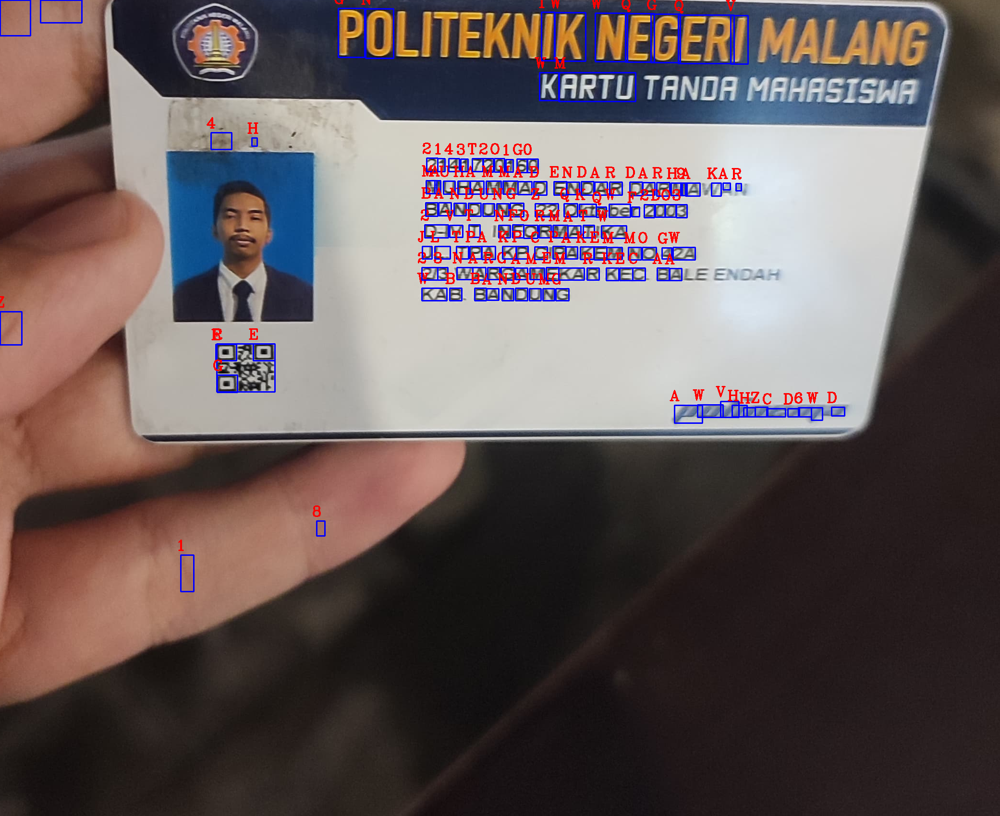

In [ ]:
# Show char with actual image
img_copy2 = crop.copy()

detected_chars = []
for(pred, (x, y, w, h)) in zip(preds, boxes):
  i = np.argmax(pred)
  char_detected = char_list[i]
  detected_chars.append(char_detected)

  cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 2)
  cv2.putText(img_copy2, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 2)

cv2_imshow(img_copy2)


In [ ]:
# Print the detected characters
print("Detected Characters:", detected_chars)

Detected Characters: ['Z', 'E', 'T', '1', '4', 'E', 'R', 'G', 'H', 'E', '8', 'G', 'N', 'W', '2', 'J', '2', 'B', 'M', '2', 'L', 'A', '3', '1', 'A', 'U', '4', 'B', 'V', 'N', 'T', 'N', 'H', '3', 'D', 'T', 'P', 'A', 'T', 'A', 'B', 'A', 'U', '2', 'M', 'A', 'R', 'O', 'N', 'N', 'G', 'N', 'K', 'M', '1', 'G', 'F', 'D', 'A', 'P', 'G', 'A', 'O', '0', 'U', 'M', 'D', 'C', 'Z', 'R', 'W', '1', 'M', 'E', 'P', 'M', 'E', 'W', 'G', 'M', 'M', 'Q', 'A', 'N', 'A', 'K', 'K', 'D', 'T', 'R', 'E', 'A', 'W', 'Q', 'W', 'K', 'M', 'W', 'R', 'E', 'Q', 'M', 'D', 'F', 'C', 'O', 'A', '2', 'G', 'D', 'R', 'A', 'G', 'O', 'A', 'H', 'W', 'A', '3', 'Q', '9', 'A', 'W', 'K', 'V', 'A', 'V', 'H', 'R', 'H', 'Z', 'C', 'D', '6', 'W', 'D']


### **Face Detection**

In [ ]:
import glob
import imutils

In [ ]:
ktm_images = []

for img_path in glob.glob('/content/drive/MyDrive/img_python/content/Kelompok 1/Kelompok 1/*'):
    if fnmatch.fnmatchcase(img_path, '*2141720160*') and img_path.endswith((".jpg")):
        img = cv2.imread(img_path)
        img = imutils.resize(img, width=640)
        ktm_images.append(img)

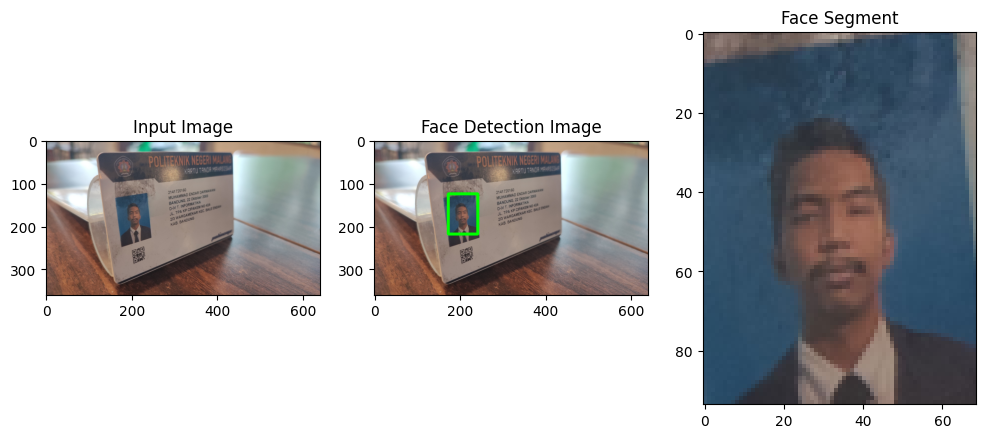

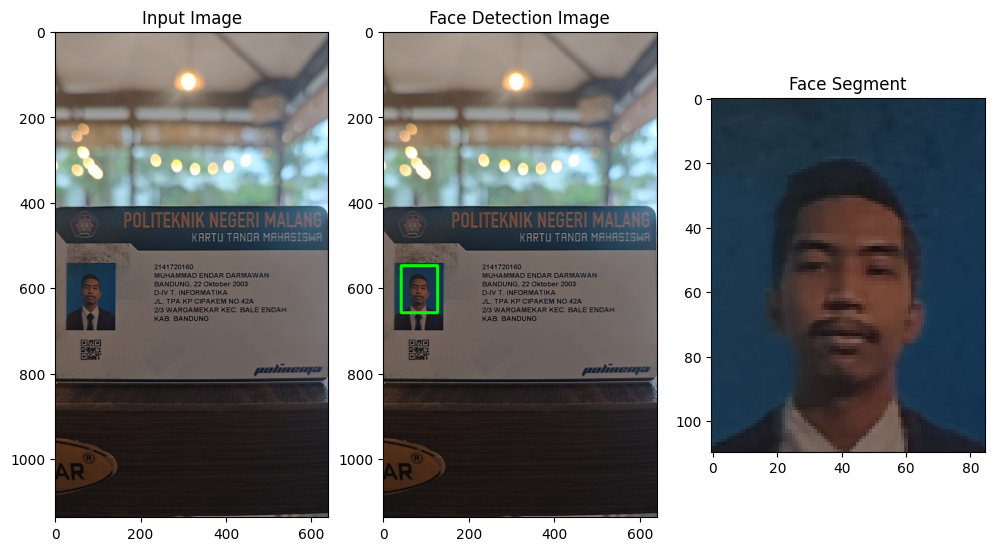

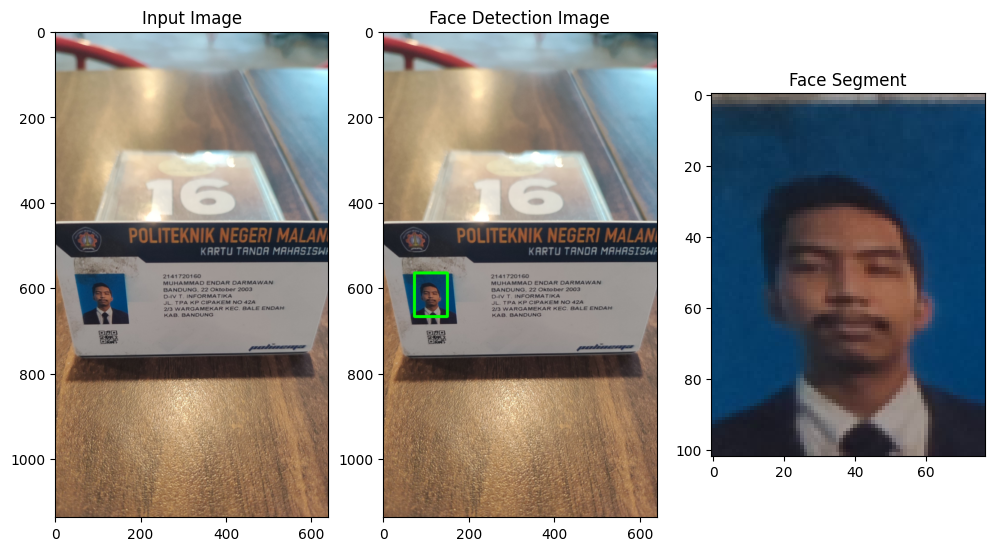

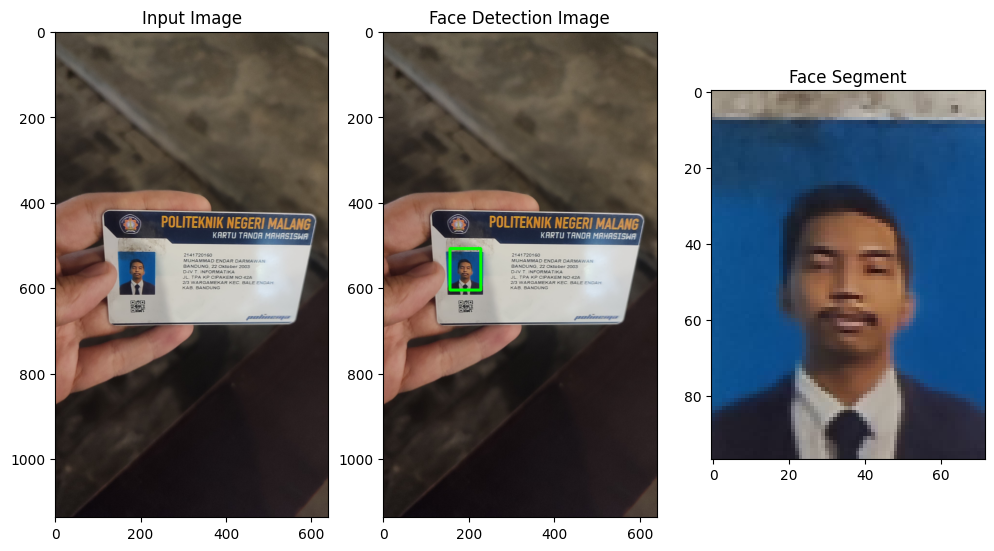

In [ ]:
haar_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/img_python/Images/haarcascades/haarcascade_frontalface_alt.xml')
mn = 5  # Set a common value for minNeighbors
sc = 1.2  # Set a common value for scaleFactor
face_segments = []

for i, ktm in enumerate(ktm_images):
    facedet_img = ktm.copy()
    faces_rects = haar_cascade.detectMultiScale(ktm, scaleFactor=sc, minNeighbors=mn)

    for (x, y, w, h) in faces_rects:
        cv2.rectangle(facedet_img, (x-15, y-30), (x+w+15, y+h+25), (0, 255, 0), 5)
        face_segment = ktm[max(0, y-30):y+h+25, max(0, x-15):x+w+15]

        face_segments.append(face_segment)

        plt.figure(figsize=(12, 8))
        plt.subplot(131), plt.imshow(cv2.cvtColor(ktm, cv2.COLOR_BGR2RGB)), plt.title('Input Image')
        plt.subplot(132), plt.imshow(cv2.cvtColor(facedet_img, cv2.COLOR_BGR2RGB)), plt.title('Face Detection Image')
        plt.subplot(133), plt.imshow(cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB)), plt.title('Face Segment')
        plt.show()